# Learning Matplotlib - Lessons from a ggplot user

## You never forget your first

I love R. I wouldn't be where I am today in my career without the tools of the Tidyverse and kindness of the Rstats and Rladies communities. It provided me a platform to entering data science, exposing me to the world of software engineering and development along the way. Choosing to use R over Stata for my Economics Honours thesis was probably the best choice I made (although I had to learn how to use Matlab and Stata for my course subjects anyway). 

I had to pick up new programming languages and tools over the past two years working as a data scientist. Learning R made it easier to understand and pick up new languages. Although this probably works via any pathway. Once you pick up one language, it is _notionally_ easier to pick up a new language with some of your current experience (note to self, this would be a good analogy for a future post on multilevel/hierarchical bayesian models). In the workplace, your choice is tool is determined by what is available on your technology stack/analytics platform and whatever your peers work with.

Most of the exploratory data analysis (EDA) and 'feature engineering' at work is done using Pyspark. We work on the AWS cloud, using EMR clusters and Zeppelin notebooks. So far I've managed. I learned how to do the majority of my work in Pyspark. I picked up standard python libraries like Pandas and NumPy, machine learning libaries (MLlib) in Pyspark, as well as wrangled many tables in SQL. 

But the _one_ thing I couldn't put myself through is learning how to plot in Python. I couldn't get over the ease and beauty of building visualisations using ggplot2. I would do all my work in SQL and pyspark, but I would _always_ finish off my EDA using ggplot. (Not pushing myself to learn Matplotlib wasn't entirely due to my affinity for ggplot, we had issues with our exploratory enviornment not producing plots correctly or taking extremely long time to render, but I digress). 

## Getting over the curve

I've been finally pushing myself to get acquainted with Python plotting libraries. I figured that it wouldn't hurt being bilingual in the two main data science languages. Plus all the developers at work are all python useres (pythonistas?), so it would be jointly beneficial to communicate using the programming lingua franca. 

I found it difficult navigating the vast array of packages Python has for plotting. Matplotlib, seaborn, altair, bokeh, etc. But I realised that most of the higher level modules are built _on top_ of matplotlib. So while you may plot using a higher level package like seaborn, a lot of the tweaking is done using matplotlib functions.

Learning matplotlib is difficult. The first thing which took me a while to wrap my head around was how I needed the data to be _structured_ to build the plots I wanted. Matplotlib requires data in a wide format, as opposed to a long (tidy) format when reading in components of the data. Seaborn was much easier to grasp as it requires long/tidy data structures when plotting. This feels more intuitive to me as a ggplot user.

## Replicating KH's COVID Small Multiples in Matplotlib

I came across [Kieran Healy's blog post](https://twitter.com/kjhealy/status/1243561750756196353) a couple of weeks ago where he plotted cumulative reported cases of the COVID-19 virus for the top 50 countries. I thought it would be a good exercise for me to try to replicate this in Matplotlib. Mainly for my own learning, but also a good task for my first blog post.

I've always admired this style of viususalistion. It preserves the variation of all the countries while highlighting the key country you want to focus on for comparison and trend analysis. I use similar plots at work all the time to assist in presentations - a clean and compact way of presenting rich datasets.

I saved myself the effort of recreating the dataset from scratch by using Kieran's R code found in his [COVID Github Repository](https://github.com/kjhealy/covid). The COVID data comes from the European Centre for Disease Prevention and Control (ECDC). Note that I have not checked the validity or accuracy of the data source or scraping process. This is just an exercise in creating a similar figure in Python.

## Preprocessing the data

Most of the data preprocessing has been completed in the R script. However, there is still a bit of work requierd to get the necessary datasets and objects prepared for plotting. 

Firstly we want to put the number of reported cases on the log scale and to clean up some of the country labels.

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as tick

# Setting some Matplotlib parameters
%matplotlib inline
mpl.rcParams['figure.dpi']= 300
plt.style.use('seaborn-talk')

# Replace the some of the country names with shorter labels
data = pd.read_csv('/Users/benjaminwee/Documents/projects/covid/bw/data/cov_case_curve1.csv')\
         .replace({'cname' : 
                   {'United States' : 'USA',
                   'Iran, Islamic Republic of' : 'Iran',
                   'Korea, Republic of' : 'South Korea', 
                   'United Kingdom' : 'UK'}})\
        .drop('Unnamed: 0', axis=1)

# Show first 5 rows of the main dataset
data.head()

,date,cname,iso3,cases,deaths,cu_cases,cu_deaths,days_elapsed,end_label
0,2020-01-19,China,CHN,136,1,216,3,0,NaN
1,2020-01-20,China,CHN,19,0,235,3,1,NaN
2,2020-01-21,China,CHN,151,3,386,6,2,NaN
3,2020-01-22,China,CHN,140,11,526,17,3,NaN
4,2020-01-23,China,CHN,97,0,623,17,4,NaN


Next, we subset our data so it contains the top 50 cumulative cases as of April 4th (df_50) and pivot them into a 'wide' format. The index of the dataframes will be the days_elapsed variable (x-axis) and the columns will be the countries we will want to plot (y-axis). ELements of the dataframe will contain the corresponding log cases.

In [2]:
## Countries - top 50 cumulative cases as of 2020-03-27
## We will use this to create a dataset with only the top 50 countries
## that we will highlight in all the subplots
top_50 = data.loc[data.groupby(["cname"])["cu_cases"].idxmax()]\
			 .sort_values('cu_cases', ascending = False)\
			 .head(50)\
			 .loc[:, ['iso3', 'cname', 'cu_cases']]

## Filter countries in top 50
_df = data.loc[data['iso3'].isin(top_50['iso3'])]\

## Restructure data into wide format
## Top 50
df_50 = _df.pivot(index = 'days_elapsed', 
			      values = 'cu_cases',
			      columns = 'cname')\
		  .reset_index(inplace=False)

# Days elapsed as index (x axis)
df_50.index = df_50['days_elapsed']

# Drop unwanted columns
#df = df.drop('days_elapsed', axis = 1)
df_50 = df_50.drop('days_elapsed', axis = 1)

# Display one of the dataframes
df_50.head()

cname,Argentina,Australia,Austria,Belgium,Brazil,Canada,Chile,China,Colombia,Croatia,...,Singapore,South Africa,South Korea,Spain,Sweden,Switzerland,Thailand,Turkey,USA,United Arab Emirates
days_elapsed,,,,,,,,,,,,,,,,,,,,,
0,128.0,100.0,102.0,109.0,121.0,103.0,156.0,216.0,102.0,104.0,...,102.0,116.0,155.0,114.0,137.0,209.0,114.0,191.0,103.0,113.0
1,158.0,112.0,131.0,169.0,200.0,138.0,201.0,235.0,128.0,126.0,...,106.0,150.0,345.0,151.0,161.0,264.0,177.0,359.0,125.0,113.0
2,225.0,126.0,182.0,200.0,234.0,176.0,238.0,386.0,158.0,206.0,...,108.0,205.0,601.0,200.0,203.0,332.0,177.0,670.0,159.0,140.0
3,266.0,156.0,246.0,239.0,291.0,244.0,342.0,526.0,210.0,235.0,...,110.0,240.0,762.0,261.0,248.0,374.0,177.0,947.0,233.0,140.0
4,301.0,197.0,361.0,267.0,428.0,304.0,434.0,623.0,235.0,306.0,...,112.0,274.0,892.0,374.0,326.0,490.0,212.0,1236.0,338.0,153.0


## Plotting single country
I started by plotting a single country before adding the other components of the final chart. Starting simple helped me get the basics right first. The below chart the cumulative growth of log cases in China by days since the 100th case.

You can plot this using matplotlib or the plot function of the pandas dataframe (commented out). All the customisation uses the matplotlib.pyplot API. The difference between using matplotlib and pandas.plot is minor in a simple plot. However, it is much easier to start off with pandas.plot then to add customisation via matplotlib when it comes to more complicated visuliastions (thanks to [Chris Moffitt's blog post](https://pbpython.com/effective-matplotlib.html) on effective plotting in Python for this advice - it a life saver when doing the subplot/facet plot below).

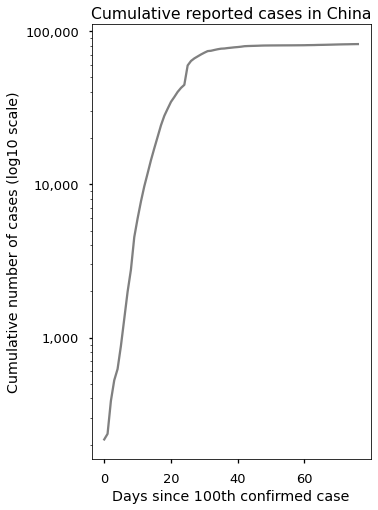

In [3]:
## Plot China
%matplotlib inline

fig, ax = plt.subplots(figsize = (5, 8))

# Matplotlib
plt.plot(df_50.index, df_50['China'], color = 'grey')

# Pandas
# df_50['China'].plot(color='grey')

# Plot customisation
plt.title('Cumulative reported cases in China')
plt.xlabel('Days since 100th confirmed case')
plt.ylabel('Cumulative number of cases (log10 scale)')
ax.set_xticks(np.arange(0, 80, 20), minor=False)
ax.set_yscale('log', basey=10)
ax.yaxis.set_major_formatter(tick.ScalarFormatter())
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
plt.savefig('/Users/benjaminwee/Documents/projects/covid/bw/figures/1.svg', dpi = 300, bbox_inches='tight')
#plt.plot();

## Plotting all countries 
Next was to display the values of all coutries in a single figure. Matplotlib requires the code to explicitly identify which columns of the dataframe it is plotting. To do this I created a list of all countries which I loop over to plot each individual line. This will also be used to 'highlight' the relevant countries in each subplot (facet) later on. 

The plot function in pandas is more forgiving. It will plot all columns for you automatically. No for loop needed (yay).

In [4]:
# Create list of countries to loop over
countries = top_50['cname'].drop_duplicates().tolist()

# Print first 5 countries
countries[0:5]

['USA', 'Italy', 'Spain', 'China', 'Germany']

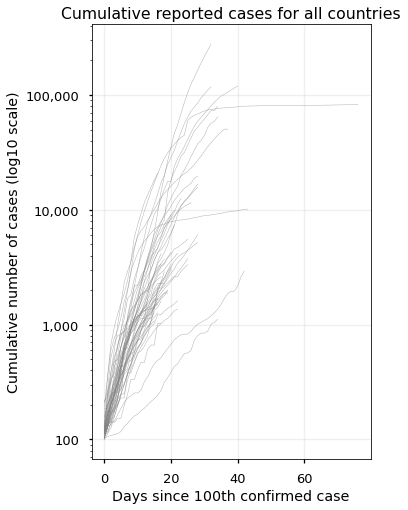

In [5]:
%matplotlib inline
fig, axes = plt.subplots(figsize = (5, 8))

for idx, count in enumerate(countries):
    # Matplotlib
    plt.plot(df_50.index, df_50[str(count)], color = 'grey', alpha = 0.6, linewidth=0.5)

# Customisation
plt.title('Cumulative reported cases for all countries')
plt.xlabel('Days since 100th confirmed case')
plt.ylabel('Cumulative number of cases (log10 scale)')
axes.set_xticks(np.arange(0, 80, 20), minor=False)
axes.set_yscale('log', basey=10)
axes.grid(alpha=0.2)
axes.yaxis.set_major_formatter(tick.ScalarFormatter())
axes.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

#plt.plot();
plt.savefig('/Users/benjaminwee/Documents/projects/covid/bw/figures/2.svg', dpi = 300, bbox_inches='tight')

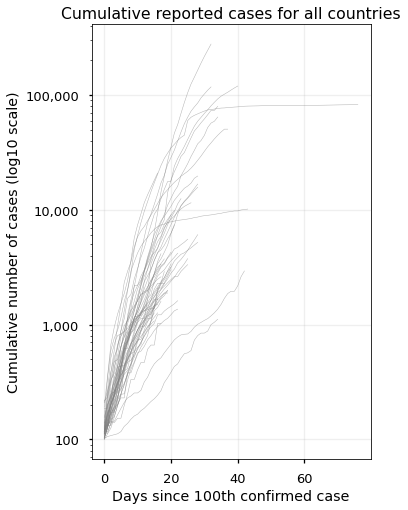

In [6]:
fig, axes= plt.subplots(figsize = (5, 8))

# Pandas
df_50.plot(color='grey', alpha = 0.6, linewidth=0.5, legend = False, ax = axes)

# Matplotlib customisation
plt.title('Cumulative reported cases for all countries')
plt.xlabel('Days since 100th confirmed case')
plt.ylabel('Cumulative number of cases (log10 scale)')
axes.set_xticks(np.arange(0, 80, 20), minor=False)
axes.set_yscale('log', basey=10)
axes.grid(alpha=0.2)
axes.yaxis.set_major_formatter(tick.ScalarFormatter())
axes.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

plt.plot();
  

## Plotting all countries in 50 subplots

This is where things get complicated. We need to loop over the countries list for both matplotlib and pandas to create subplots for each of the top 50 countries. This means that matplotlib has another for loop to compute all the cumulative cases as well as doing it across subplots. I spent quite a few hours trying _not_ to do this (I would've got this post out a lot earlier). 

But it turns out the best way to do this is just plot the 50 countries using pandas.plot and use the for loop to plot across all subplots. I've kept my attempted matplotlib version in the tab below, but please get in touch if you know a better way of doing this purely in matplotlib.

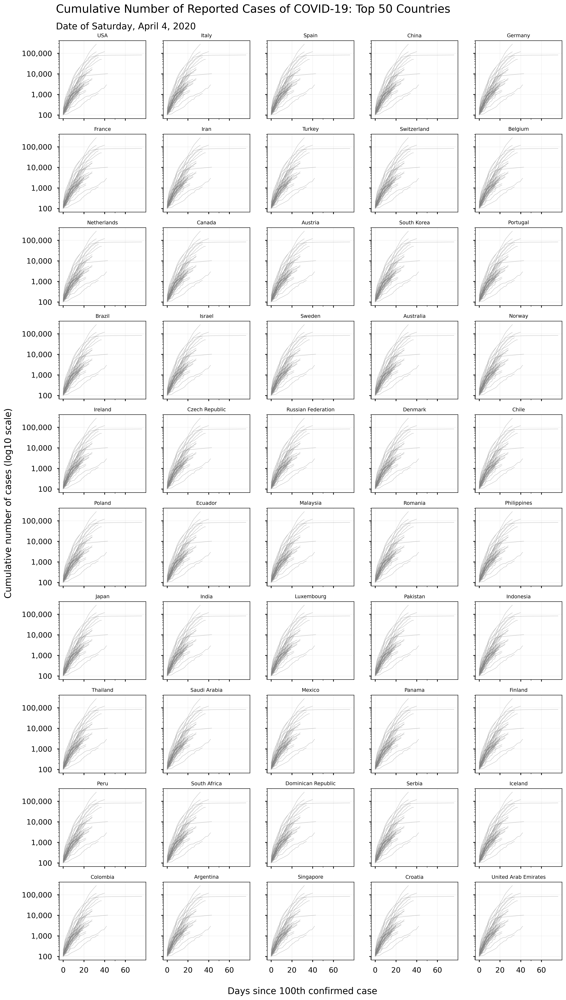

<Figure size 1800x1200 with 0 Axes>

In [7]:
mpl.rcParams['figure.dpi']= 300
fig, axes = plt.subplots(10, 5, figsize = (16, 30), sharex = True, sharey = True)

for idx, count in enumerate(countries):
    # Get grey lines for all subplots
	df_50.plot(ax = axes[idx//5][idx%5],
                legend = False, 
                color='grey',  
                alpha = 0.6, 
                linewidth=0.5)

	axes[idx//5][idx%5].set_title(str(count), size = 9)
	axes[idx//5][idx%5].set_xlabel('')
	axes[idx//5][idx%5].set_ylabel('')
	axes[idx//5][idx%5].set_yscale('log', basey=10)
	axes[idx//5][idx%5].yaxis.set_major_formatter(tick.ScalarFormatter())
	axes[idx//5][idx%5].get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
	axes[idx//5][idx%5].grid(alpha=0.1)
	axes[idx//5][idx%5].set_xticks(np.arange(0, 80, 20), minor=False)
    
fig.suptitle('Cumulative Number of Reported Cases of COVID-19: Top 50 Countries', fontsize=20,
            x=0.12, y=.91, horizontalalignment='left', verticalalignment='top')
fig.text(0.12, 0.895, 'Date of Saturday, April 4, 2020', fontsize=16, ha='left', va='top')
fig.text(0.04, 0.5, 'Cumulative number of cases (log10 scale)', va='center', rotation='vertical', size = 16) 
fig.text(0.5, 0.097, 'Days since 100th confirmed case', ha='center', size = 16)

plt.savefig('/Users/benjaminwee/Documents/projects/covid/bw/figures/3.svg', dpi = 300, bbox_inches='tight')
plt.figure(); 

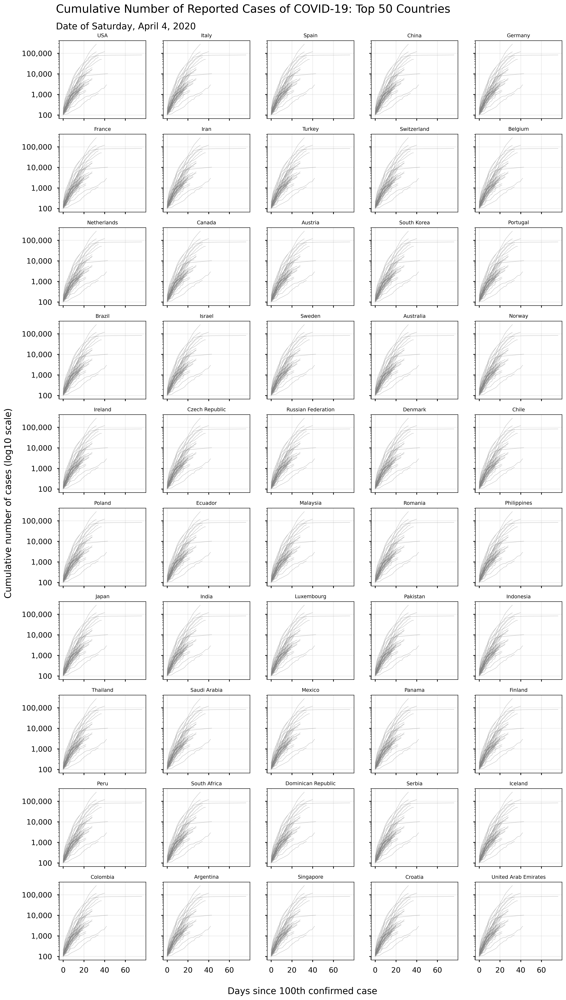

In [8]:
mpl.rcParams['figure.dpi']= 300
fig, axes = plt.subplots(10, 5, figsize = (16, 30), sharex = True, sharey = True)

for idx, count in enumerate(countries):
	for country in enumerate(countries):
		axes[idx//5][idx%5].plot(df_50.index, df_50[str(country[1])],
                                 color='grey',  
                                 alpha = 0.6, 
                                 linewidth=0.5)
   
		axes[idx//5][idx%5].title.set_text(str(count))
		axes[idx//5][idx%5].set_title(str(count), size = 9)
		axes[idx//5][idx%5].set_xlabel('')
		axes[idx//5][idx%5].set_ylabel('')
		axes[idx//5][idx%5].set_yscale('log', basey=10)
		axes[idx//5][idx%5].yaxis.set_major_formatter(tick.ScalarFormatter())
		axes[idx//5][idx%5].get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
		axes[idx//5][idx%5].grid(alpha=0.2)
		axes[idx//5][idx%5].set_xticks(np.arange(0, 80, 20), minor=False)

fig.suptitle('Cumulative Number of Reported Cases of COVID-19: Top 50 Countries', fontsize=20,
            x=0.12, y=.91, horizontalalignment='left', verticalalignment='top')
fig.text(0.12, 0.895, 'Date of Saturday, April 4, 2020', fontsize=16, ha='left', va='top')
fig.text(0.04, 0.5, 'Cumulative number of cases (log10 scale)', va='center', rotation='vertical', size = 16) 
fig.text(0.5, 0.097, 'Days since 100th confirmed case', ha='center', size = 16)
        
plt.plot();

## Highlighting countries and adding points

Finally all that's left to do is to highlight the line corresponding to the country in the subplot and add a point for the end of each line. To do plot the points at the end of each red line, I create and loop over a dataframe which contains the top 50 countries with the corresponding latest day elapsed and cumulative case. This is completed using just pandas.plot and customised with matplotlib functions. 

And that's it! If you have any feedback on how I may improve my code, please let me know. Thanks for reading!

In [9]:
# Subset dataframe with top 50 countries and the latest 
markers = data.loc[data.groupby(["cname"])["cu_cases"].idxmax()]\
			 .sort_values('cu_cases', ascending = False)\
			 .head(50)\
			 .loc[:, ['days_elapsed', 'cname', 'cu_cases']]

markers.head()

,days_elapsed,cname,cu_cases
1965,32,USA,277965
1909,40,Italy,119827
1954,32,Spain,117710
1878,76,China,82527
1896,34,Germany,79696


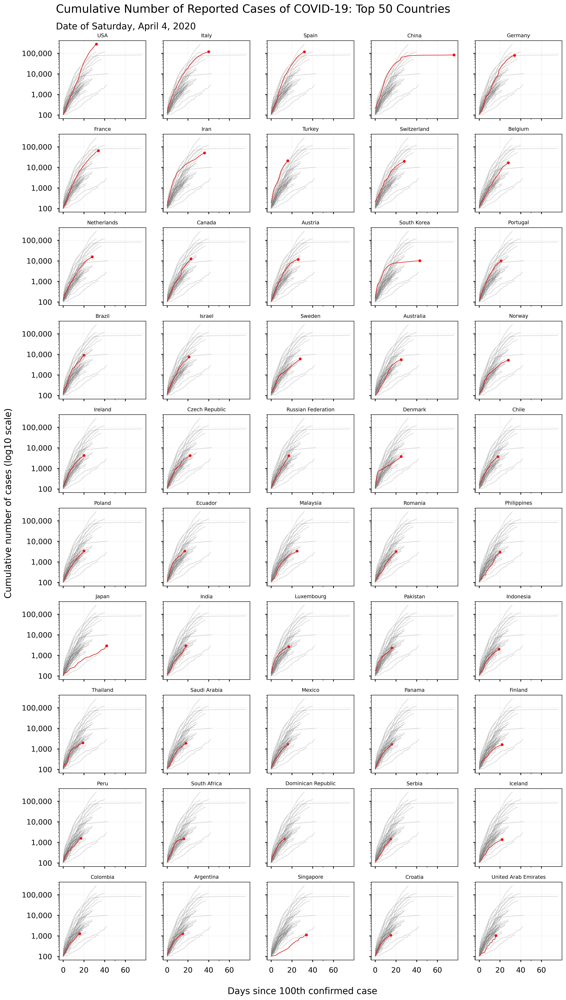

<Figure size 1800x1200 with 0 Axes>

In [10]:
mpl.rcParams['figure.dpi']= 300
fig, axes = plt.subplots(10, 5, figsize = (16, 30), sharex = True, sharey = True)

for idx, count in enumerate(countries):
    # Get grey lines for all subplots
	df_50.plot(ax = axes[idx//5][idx%5],
                legend = False, 
                color='grey',  
                alpha = 0.6, 
                linewidth=0.5)
   
    # Highlight relevant countries for each subplot
	df_50[str(count)].plot(ax = axes[idx//5][idx%5],
                            legend = False, 
                            color='red',
                            linewidth=0.9)
    
    # Add markers at the end of each line
	markers.query('cname == "{}"'.format(count))\
           .plot.scatter(ax = axes[idx//5][idx%5],
                         x='days_elapsed', 
                         y='cu_cases', 
                         color = 'red')
    
	axes[idx//5][idx%5].set_title(str(count), size = 9)
	axes[idx//5][idx%5].set_xlabel('')
	axes[idx//5][idx%5].set_ylabel('')
	axes[idx//5][idx%5].set_yscale('log', basey=10)
	axes[idx//5][idx%5].yaxis.set_major_formatter(tick.ScalarFormatter())
	axes[idx//5][idx%5].get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))
	axes[idx//5][idx%5].grid(alpha=0.1)
	axes[idx//5][idx%5].set_xticks(np.arange(0, 80, 20), minor=False)
    
fig.suptitle('Cumulative Number of Reported Cases of COVID-19: Top 50 Countries', fontsize=20,
            x=0.12, y=.91, horizontalalignment='left', verticalalignment='top')
fig.text(0.12, 0.895, 'Date of Saturday, April 4, 2020', fontsize=16, ha='left', va='top')
fig.text(0.04, 0.5, 'Cumulative number of cases (log10 scale)', va='center', rotation='vertical', size = 16) 
fig.text(0.5, 0.097, 'Days since 100th confirmed case', ha='center', size = 16)

#plt.savefig('/Users/benjaminwee/Documents/projects/covid/bw/figures/4.svg', dpi = 300, bbox_inches='tight')
plt.figure();
#fig.text(0.3, 0.90,'Date of Friday, March 28, 2020', fontsize=16, va='center')plt.savefig('/Users/benjaminwee/Documents/projects/covid/bw/final_plot.png',dpi = 300)